<img src="https://github.com/insaid2018/Term-1/blob/master/Images/INSAID_Full%20Logo.png?raw=true" width="240" height="360" />

# Exploratory Data Analysis - CAPSTONE PROJECT 

<a id=section1></a> 
## 1. Problem Statement 

It's always wonderful to see services customized to your needs.
Businesses try to understand your behavior and adjust their offerings
so as to ensure you feel attached to their services.

1. Do an Analysis of the preprocessed data.

Here are the points about how Analysis should be done:

1. Distribution of Users(device_id) across States.
2. Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands).
3. Distribution of Users across Gender.
4. Distribution of Users across Age Segments.
5. Distribution of Phone Brands(Consider only 10 Most used Phone Brands) for each Age Segment, State, Gender.
6. Distribution of Gender for each State, Age Segment and Phone Brand(Consider only 10 Most used Phone Brands).
7. Distribution of Age Segments for each State, Gender and Phone Brand(Consider only 10 Most used Phone Brands).

Note: While doing analysis for the above points, consider only one instance of a particular User(device_id) as a User can do multiple phone calls and considering every instance of the same User can give misleading numbers.
8. Hourly distribution of Phone Calls.
9. Plot the Users on the Map using any suitable package.



<a id=section2></a> 
### 2. Load the packages and data 

In [1]:
!pip install mysql.connector

import sys                                                                      # Import packages
import pandas as pd
import numpy as np
import mysql.connector
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import pie, axis, show
%matplotlib inline                                                              

import warnings                                                                 # Ignore warning related to pandas_profiling
warnings.filterwarnings('ignore') 

sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To adjust seaborn settings for the plots.
    
np.set_printoptions(precision=4)                    # To display values only upto four decimal places. 
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', -1)           # To display all the data in each column
pd.options.display.max_columns = 100                 # To display every column of the dataset in head()

plt.style.use('seaborn-whitegrid')                  # To apply seaborn whitegrid style to the plots.
%matplotlib inline

import pandas_profiling                      # Get a quick overview for all the variables using pandas_profiling                                         

from pandas.plotting import parallel_coordinates
import folium
from folium.plugins import MarkerCluster


Processing /Users/703189997mac/Library/Caches/pip/wheels/57/e4/98/5feafb5c393dd2540e44b064a6f95832990d543e5b4f53ea8f/mysql_connector-2.2.9-cp38-cp38-macosx_10_9_x86_64.whl


## Loading Data

In [2]:
#Loading Events Data
df_events = pd.read_csv("events_data.csv")

#Establize SQL connection to fetch data for Gender, model 
def SqlConnection():
    return mysql.connector.connect(  host="cpanel.insaid.co",  user="student",  password="student",  database="Capstone1")


df_gender = pd.read_sql('SELECT * FROM gender_age_train', con=SqlConnection())
df_model  = pd.read_sql('SELECT * FROM phone_brand_device_model', con=SqlConnection())

### Analyzing Data

In [3]:
def missing_data(df):
    total = df.isnull().sum().sort_values(ascending = False)
    percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

In [4]:
def analyze_df(df):
    print(df.shape)
    print("----------------------------------------Shape--------------------------------------------------")
    print(df.info(null_counts=True))
    print("--------------------------------------- Describe ---------------------------------------------")
    print(df.describe())
    print("-----------------------------------------Missing Data---------------------------------------------")
    print(missing_data(df))
    return(df.head())

In [5]:
analyze_df(df_events)

(3252950, 7)
----------------------------------------Shape--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   event_id   3252950 non-null  int64  
 1   device_id  3252497 non-null  float64
 2   timestamp  3252950 non-null  object 
 3   longitude  3252527 non-null  float64
 4   latitude   3252527 non-null  float64
 5   city       3252950 non-null  object 
 6   state      3252573 non-null  object 
dtypes: float64(3), int64(1), object(3)
memory usage: 173.7+ MB
None
--------------------------------------- Describe ---------------------------------------------
           event_id     device_id     longitude      latitude
count  3.252950e+06  3.252497e+06  3.252527e+06  3.252527e+06
mean   1.626476e+06  1.012200e+17  7.815868e+01  2.168851e+01
std    9.390459e+05  5.316758e+18  4.235570e+00  5.

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2.973348e+18,2016-05-07 22:52:05,77.225676,28.730140,Delhi,Delhi
1,2955066,4.734221e+18,2016-05-01 20:44:16,88.388361,22.660325,Calcutta,WestBengal
2,605968,-3.264500e+18,2016-05-02 14:23:04,77.256809,28.757906,Delhi,Delhi
3,448114,5.731369e+18,2016-05-03 13:21:16,80.343613,13.153332,Chennai,TamilNadu
4,665740,3.388880e+17,2016-05-06 03:51:05,85.997745,23.842609,Bokaro,Jharkhand


**Observations**
- Events Table has 3252950 records
- Missing/non-null values for device_id, latitudte, longitue, state
- Timestamp is of object datatype

**Action items**
- Data imputation/correction required for device_id, latitudte, longitue, state
- Convert timestamp to datatime stamp for further analysis


In [6]:
analyze_df(df_model)


(87726, 3)
----------------------------------------Shape--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   device_id     87726 non-null  int64 
 1   phone_brand   87726 non-null  object
 2   device_model  87726 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB
None
--------------------------------------- Describe ---------------------------------------------
          device_id
count  8.772600e+04
mean  -5.212557e+15
std    5.330157e+18
min   -9.223322e+18
25%   -4.623331e+18
50%   -3.109802e+16
75%    4.635194e+18
max    9.222849e+18
-----------------------------------------Missing Data---------------------------------------------
              Total  Percent
device_model  0      0.0    
phone_brand   0      0.0    
device_id     0      0.0    


,device_id,phone_brand,device_model
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,小米,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,三星,A368t
4,-2015528097870762664,小米,红米Note2


**Observations**
- Phone Model data has 87726 records
- No missing value found
- Unlike events table, datatype of device_id is integer
- phone_brand column has non-English data

**Action items**
- Datatype correction for device_id is required
- Translation of non-English data is required

In [7]:
analyze_df(df_gender)

(74645, 4)
----------------------------------------Shape--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB
None
--------------------------------------- Describe ---------------------------------------------
          device_id           age
count  7.464500e+04  74645.000000
mean  -7.491354e+14  31.410342   
std    5.327150e+18  9.868735    
min   -9.223067e+18  1.000000    
25%   -4.617367e+18  25.000000   
50%   -1.841362e+16  29.000000   
75%    4.636656e+18  36.000000   
max    9.222849e+18  96.000000   
-----------------------------------------Missing Data------------------------------------------

,device_id,gender,age,group
0,-8076087639492063270,M,35,M32-38
1,-2897161552818060146,M,35,M32-38
2,-8260683887967679142,M,35,M32-38
3,-4938849341048082022,M,30,M29-31
4,245133531816851882,M,30,M29-31


**Observations**
- Phone Model data has 74645 records
- No missing value found
- Unlike events table, datatype of device_id is integer

**Action items**
- Datatype correction for device_id is required


In [8]:
missing_data(df_events)

,Total,Percent
device_id,453,0.013926
latitude,423,0.013004
longitude,423,0.013004
state,377,0.011589
city,0,0.000000
timestamp,0,0.000000
event_id,0,0.000000


### Correcting Data

#### Data Corrections for device_id, latitudte, longitue, state in EVENTS table


In [9]:
missing_data(df_events)

,Total,Percent
device_id,453,0.013926
latitude,423,0.013004
longitude,423,0.013004
state,377,0.011589
city,0,0.000000
timestamp,0,0.000000
event_id,0,0.000000


In [10]:

'''
Function that computes the mode value of state based on city
'''
def compute_state(r):
    city_temp = r.name[0]    

    if r.count() > 0:
        return r.mode()
    else:
       
        dt_temp = df[df.city == city_temp].city
        if dt_temp.count() > 0:
            return dt_temp.mode()
        else:
            return df.city.mode()
        
        
'''
Create a staging "State" dataframe for all city
'''
df_stage = df_events.groupby(['city']).state.apply(compute_state).reset_index()
df_stage.rename(columns={'state':'state_mode'}, inplace=True)


In [11]:
'''
Function that return state value for missing records
'''
def get_missing_state(r):
    if pd.isnull(r.state):
        return df_stage[(df_stage.city == r.city)].state_mode.values[0]
    else:
        return r.state
    
'''
Fix the missing state values
'''
print('--------------Before fix-----------------')
print(df_events[df_events.state.isnull()].shape)


df_events.state=df_events.apply(get_missing_state, axis=1)
print('--------------After fix -----------------')
print(df_events[df_events.state.isnull()].shape)

--------------Before fix-----------------
(377, 7)
--------------After fix -----------------
(0, 7)


In [12]:
missing_data(df_events)

,Total,Percent
device_id,453,0.013926
latitude,423,0.013004
longitude,423,0.013004
state,0,0.000000
city,0,0.000000
timestamp,0,0.000000
event_id,0,0.000000


In [13]:
df_events[df_events['longitude'].isnull()]['city'].unique()

array(['Delhi', 'Indore', 'Visakhapatnam', 'Chennai', 'Pune', 'Jaipur',
       'Araria', 'Moga', 'Bagaha'], dtype=object)

In [14]:
print('Citywise checking new lat-long\n','--------------------------------------------')
for city in df_events[df_events.latitude.isnull()]['city'].unique():
    T_DF = df_events.loc[(df_events.latitude.isnull() == 0) & (df_events.city == city), 
                            ("latitude","longitude")].head(1)
    print('city',city,
          'latitude',T_DF.latitude.values[0],
          'longitude',T_DF.longitude.values[0]
         );
    

Citywise checking new lat-long
 --------------------------------------------
city Delhi latitude 28.73014 longitude 77.22567599999998
city Indore latitude 22.782454 longitude 75.920838
city Visakhapatnam latitude 17.768148999999994 longitude 83.39824399999998
city Chennai latitude 13.153332 longitude 80.34361299999998
city Pune latitude 18.615791 longitude 73.875196
city Jaipur latitude 26.93117 longitude 75.863671
city Araria latitude 26.211919 longitude 87.570736
city Moga latitude 30.847549 longitude 75.25197
city Bagaha latitude 27.129966000000003 longitude 84.113853


In [15]:
print('Citywise updating new lat-long\n','--------------------------------------------')
for city in df_events[df_events.latitude.isnull()]['city'].unique():
    T_DF = df_events.loc[(df_events.latitude.isnull() == 0) & (df_events.city == city), ("latitude","longitude")].head(1)
    print('city',city,'latitude',T_DF.latitude.values[0],'longitude',T_DF.longitude.values[0]);
#     print('main lat',DF_MAIN_DATA.loc[(DF_MAIN_DATA.latitude.isnull()) & (DF_MAIN_DATA.city == city), "latitude"].index[0])
    df_events.loc[(df_events.latitude.isnull()) & (df_events.city == city), "latitude"] = T_DF.latitude.values[0]
    df_events.loc[(df_events.longitude.isnull()) & (df_events.city == city), "longitude"] = T_DF.longitude.values[0]

if ((df_events.latitude.isnull().sum() == 0) & (df_events.longitude.isnull().sum() == 0)):
    print('Lat & Long updated successfully')
else:
    print('Some Lat & Long not updated')

Citywise updating new lat-long
 --------------------------------------------
city Delhi latitude 28.73014 longitude 77.22567599999998
city Indore latitude 22.782454 longitude 75.920838
city Visakhapatnam latitude 17.768148999999994 longitude 83.39824399999998
city Chennai latitude 13.153332 longitude 80.34361299999998
city Pune latitude 18.615791 longitude 73.875196
city Jaipur latitude 26.93117 longitude 75.863671
city Araria latitude 26.211919 longitude 87.570736
city Moga latitude 30.847549 longitude 75.25197
city Bagaha latitude 27.129966000000003 longitude 84.113853
Lat & Long updated successfully


In [16]:
missing_data(df_events)

,Total,Percent
device_id,453,0.013926
state,0,0.000000
city,0,0.000000
latitude,0,0.000000
longitude,0,0.000000
timestamp,0,0.000000
event_id,0,0.000000


In [17]:
DF_CITY_LAT_LONG = df_events[(df_events.device_id.isnull())].groupby(['city','latitude','longitude']).count()
print('City with lat-long where device id not found')
DF_CITY_LAT_LONG

City with lat-long where device id not found


event_id  device_id  timestamp  state
city          latitude  longitude                                       
Bardoli       21.194283 73.169345  16        0          16         16   
Chennai       13.149176 80.309272  21        0          21         21   
              13.153332 80.343613  21        0          21         21   
              13.189053 80.335435  21        0          21         21   
Delhi         28.719966 77.292481  23        0          23         23   
              28.721053 77.274814  23        0          23         23   
              28.728888 77.303153  23        0          23         23   
Hoshiarpur    31.561747 75.992551  16        0          16         16   
Indore        22.777781 75.923332  17        0          17         17   
              22.814519 75.882956  17        0          17         17   
              22.817526 75.958050  17        0          17         17   
Jaipur        26.948689 75.888487  27        0          27         27   
              26.953990 75.836167  27        0          27         27   
              26.960796 75.846007  27        0          27         27   
Jetpur        21.790693 70.686387  16        0          16         16   
Pune          18.566925 73.860165  24        0          24         24   
              18.614812 73.926499  24        0          24         24   
              18.628057 73.862756  24        0          24         24   
Visakhapatnam 17.752819 83.371738  23        0          23         23   
              17.805195 83.357991  23        0          23         23   
              17.822906 83.342711  23        0          23         23

In [18]:
print('Updating new device id\n----------------------------------------------------')
for r in DF_CITY_LAT_LONG.index:
    T_DF = df_events.loc[ (df_events.device_id.isnull() == 0)  & (df_events.city == r[0]) 
                   & (df_events.latitude == r[1]) 
                   & (df_events.longitude == r[2]), ("city","device_id","latitude","longitude")].head(1)
    print('For city',T_DF.city.values[0],'device id',T_DF.device_id.values[0],'for latitude:',T_DF.latitude.values[0],
          '& longitude:',T_DF.longitude.values[0])
    df_events.loc[(df_events.device_id.isnull()) & (df_events.city ==  r[0])
             & (df_events.latitude == r[1]) & (df_events.longitude == r[2]), "device_id"] = T_DF.device_id.values[0]
    
if (df_events.device_id.isnull().sum() == 0):
    print('device_id update successfully')
else:
    print('Some device_id not updated')

Updating new device id
----------------------------------------------------
For city Bardoli device id -8.215770519233686e+18 for latitude: 21.194283 & longitude: 73.16934499999998
For city Chennai device id 7.66213914371992e+18 for latitude: 13.149176 & longitude: 80.30927199999998
For city Chennai device id 5.731369272434022e+18 for latitude: 13.153332 & longitude: 80.34361299999998
For city Chennai device id 7.983871429718485e+18 for latitude: 13.189053 & longitude: 80.33543499999998
For city Delhi device id 5.098778421671838e+18 for latitude: 28.719966000000003 & longitude: 77.29248100000002
For city Delhi device id 3.724654925765159e+18 for latitude: 28.721053 & longitude: 77.27481399999998
For city Delhi device id -6.875585507485886e+18 for latitude: 28.728888 & longitude: 77.30315300000002
For city Hoshiarpur device id 1.750778632182067e+18 for latitude: 31.561746999999997 & longitude: 75.99255099999998
For city Indore device id 7.597735768595925e+18 for latitude: 22.777781 & lo

In [19]:
missing_data(df_events)

,Total,Percent
state,0,0.0
city,0,0.0
latitude,0,0.0
longitude,0,0.0
timestamp,0,0.0
device_id,0,0.0
event_id,0,0.0


In [20]:

#convert date to datetime
df_events.timestamp=pd.to_datetime(df_events.timestamp)

# extracting date to different columns 
df_events['year']=df_events.timestamp.dt.year
df_events['month']=df_events.timestamp.dt.month
df_events['day']=df_events.timestamp.dt.day
df_events['time']=df_events.timestamp.dt.hour
#df_events['dayname'] = df_events['timestamp'].dt.weekday_name


In [21]:
df_events.head(2)

,event_id,device_id,timestamp,longitude,latitude,city,state,year,month,day,time
0,2765368,2.973348e+18,2016-05-07 22:52:05,77.225676,28.730140,Delhi,Delhi,2016,5,7,22
1,2955066,4.734221e+18,2016-05-01 20:44:16,88.388361,22.660325,Calcutta,WestBengal,2016,5,1,20


### Data corrections for Model name and datatype of device_id in df_model

In [22]:
brands_in_chinese = ['华为','小米','三星','魅族','酷派','乐视','联想 ','vivo','OPPO','HTC','LG','TCL','LOGO','Lovme','ZUK','PPTV','努比亚','海信','天语','夏新','欧比', '优米', '欧博信', '奇酷', '锤子', '酷比魔方', '语信', '朵唯', '德赛', '一加',
       '华硕', '普耐尔', '易派', '摩托罗拉', '优购', '酷珀', '梦米', '爱派尔', '昂达', '邦华',
       '聆韵', '中国移动', '诺亚信', '酷比', '艾优尼', '斐讯', '富可视', '欧新', '美图', '宝捷讯',
       '青橙', '果米', '波导', '诺基亚', '神舟', '糯米', '亿通', '纽曼', '唯米', '百立丰',
       '沃普丰', '虾米', '凯利通', '贝尔丰', '至尊宝', '蓝魔', '青葱', '白米', '大可乐', '尼比鲁',
       '康佳', '乡米', '黑米', '海尔', '优语', '维图', '米歌', '广信', 'E派', '小杨树', '糖葫芦',
       '西米', '谷歌', '长虹', '飞利浦', '惠普', '台电', '大Q', '鲜米', '先锋', '欧奇']
brands_in_english = ['Huawei','Xiaomi','Samsung','Meizu','Coolpad','LeEco','Lenovo','vivo','OPPO','HTC','LG','TCL','LOGO','Lovme','ZUK','PPTV','Nubia','Hisense','Amagatarai','Amoi','Obi', 'Youmi', 'Obson', 'Qiku', 'Hammer', 'Cubei Cube', 'Letters', 'Duowei', 'Desai', 'One Plus','ASUS', 'Punale', 'Yipai', 'Motorola', 'Yougo', 'Cooper', 'Mengmi', 'Aipair', 'Onda', 'Banghua', 'Lingyun', 'China Mobile', 'Noah',' Coolby ',' Aiyouni ',' Feixun ',' Focus', 'Ou Xin', 'Meitu', 'Projet News','Green Orange', 'Fruit Rice', 'Flyer', 'Nokia', 'Shenzhou', 'Glutinous Rice', 'Yi Tong', 'Newman', 'Wei Mi', 'Bai Li Feng','Wopfung', 'Shrimp', 'Kellystone', 'Bellfonte', 'Extreme Treasure', 'Blue Devils', 'Scallion', 'White Rice', 'Big Cola', 'Nibiru','Kangjia', 'Xianmi', 'Black Rice', 'Haier', 'Youyu', 'Weitu', 'Mi Ge', 'Guangxin', 'E-Pay', 'Little Poplar', ' Candied ','Simi', 'Google', 'Changhong', 'Philips', 'HP', 'Taipower', 'Big Q', 'Fresh Rice', 'Pioneer', 'Ouqi']

brands_dict1 = dict(zip(brands_in_chinese, brands_in_english)) 

In [23]:
def translator(val):
    if val in brands_dict1:
        return brands_dict1[val]
    else:
        return val

In [24]:
df_model.phone_brand = df_model.phone_brand.apply(translator)

In [25]:
df_model.head()

,device_id,phone_brand,device_model
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,Xiaomi,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,Samsung,A368t
4,-2015528097870762664,Xiaomi,红米Note2


In [26]:
#change datatype for device_id to float
df_model['device_id'] = df_model['device_id'].astype(float)

In [27]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   device_id     87726 non-null  float64
 1   phone_brand   87726 non-null  object 
 2   device_model  87726 non-null  object 
dtypes: float64(1), object(2)
memory usage: 2.0+ MB


### Data corrections for datatype of device_id in df_gender

In [28]:
df_gender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB


In [29]:
#change datatype for device_id to float
df_gender['device_id'] = df_gender['device_id'].astype(float)

In [30]:
df_gender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   device_id  74645 non-null  float64
 1   gender     74645 non-null  object 
 2   age        74645 non-null  int64  
 3   group      74645 non-null  object 
dtypes: float64(1), int64(1), object(2)
memory usage: 2.3+ MB


### Data Cleanup done

# Merging Datasets

Merge df_events, df_gender, df_model

In [31]:
df_final = df_events.merge(df_model,on='device_id').merge(df_gender,on='device_id')

In [32]:
df_final.shape

(3252950, 16)

In [33]:
df_final.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,year,month,day,time,phone_brand,device_model,gender,age,group
0,2765368,2.973348e+18,2016-05-07 22:52:05,77.225676,28.73014,Delhi,Delhi,2016,5,7,22,Youmi,UIMI3,M,35,M32-38
1,1355198,2.973348e+18,2016-05-01 01:35:45,77.225676,28.73014,Delhi,Delhi,2016,5,1,1,Youmi,UIMI3,M,35,M32-38
2,1630972,2.973348e+18,2016-05-03 00:07:34,77.225676,28.73014,Delhi,Delhi,2016,5,3,0,Youmi,UIMI3,M,35,M32-38
3,2732453,2.973348e+18,2016-05-01 06:15:59,77.225676,28.73014,Delhi,Delhi,2016,5,1,6,Youmi,UIMI3,M,35,M32-38
4,1562542,2.973348e+18,2016-05-01 20:34:19,77.225676,28.73014,Delhi,Delhi,2016,5,1,20,Youmi,UIMI3,M,35,M32-38


# EDA

### 1. Total Unique devices

In [34]:
print(df_events.device_id.nunique())
print(df_final.device_id.nunique())

60865
60865


Therer eare 60865 unique device id for which events have been captured 

### 2. Check the unique device id spread across states

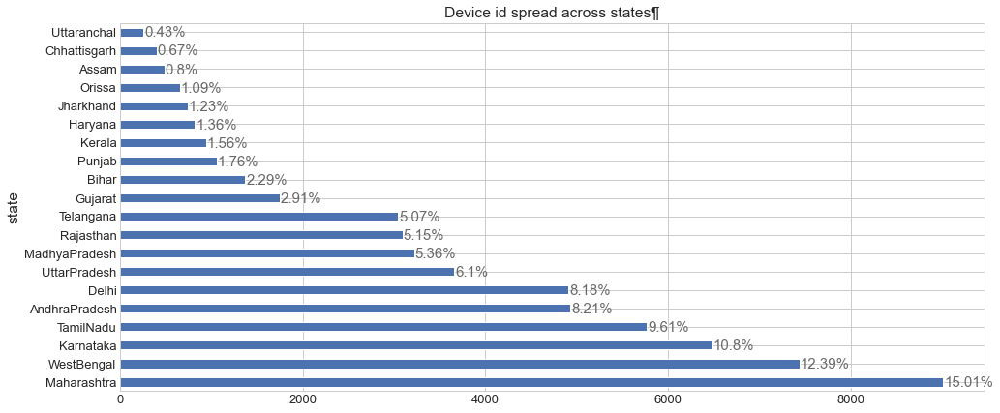

In [35]:
plt.figure(figsize=(25,25))
plt.title("Device id spread across states¶")
ax=(df_final.groupby(['state','device_id']).device_id.count()).groupby('state').count().nlargest(20).plot(kind='barh', figsize=(16,7),  fontsize=13)
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in ax.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+10, i.get_y(), \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,color='dimgrey')

####  Maharashtra state has maximum no. of users, followed by WestBengal, Karnataka and so on

### 3. Check the usage spread across states

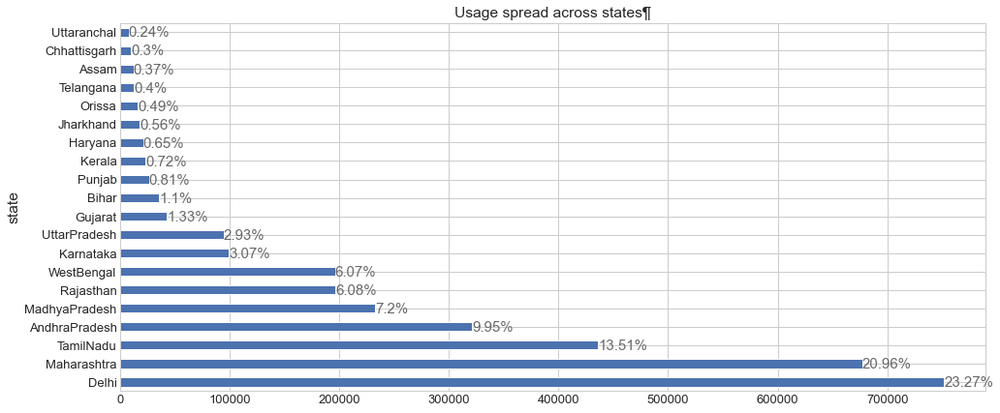

In [36]:
plt.figure(figsize=(25,25))
plt.title("Usage spread across states¶")
ax=(df_final.groupby('state')['event_id'].count()).nlargest(20).plot(kind='barh', figsize=(16,7),  fontsize=13)
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in ax.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+10, i.get_y(), \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,color='dimgrey')

### Delhi users have max usage follwed by Maharashtra and Tamil Nadu

## Gender wise usage

M    2186002
F    1066948
Name: gender, dtype: int64


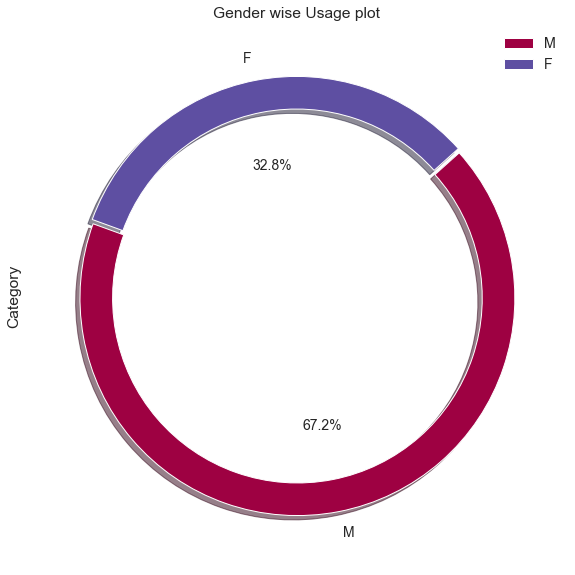

In [37]:

space = np.ones(2)/100
df_final['gender'].value_counts().plot(kind='pie',explode=space,  fontsize=14, autopct='%3.1f%%', wedgeprops=dict(width=0.15), 
                                       shadow=True, startangle=160, figsize=(10,10), cmap='Spectral', legend=True)

plt.ylabel('Category')
plt.title('Gender wise Usage plot')

values=df_final['gender'].value_counts()
print(values)

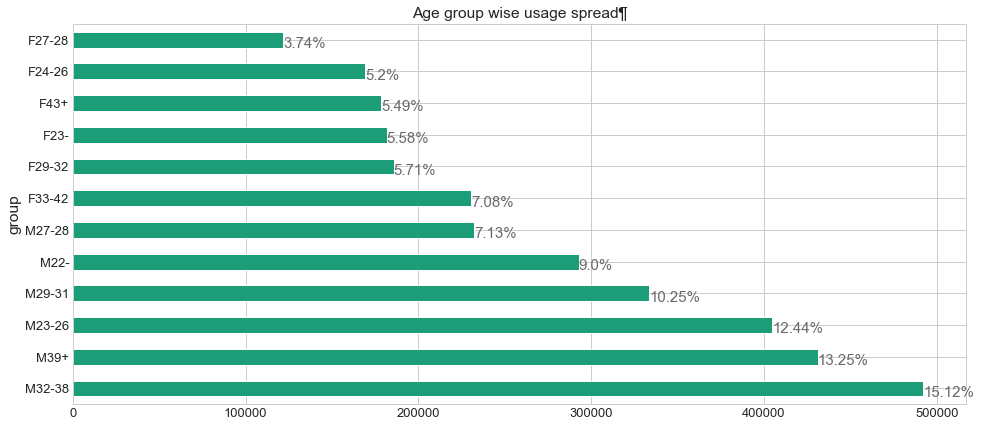

In [38]:
plt.figure(figsize=(25,25))
plt.title("Age group wise usage spread¶")
ax=(df_final.groupby('group')['event_id'].count()).nlargest(30).plot(kind='barh', figsize=(16,7), cmap='Dark2', fontsize=13)
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in ax.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+10, i.get_y(), \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,color='dimgrey')

#### Top 10 brands that were used

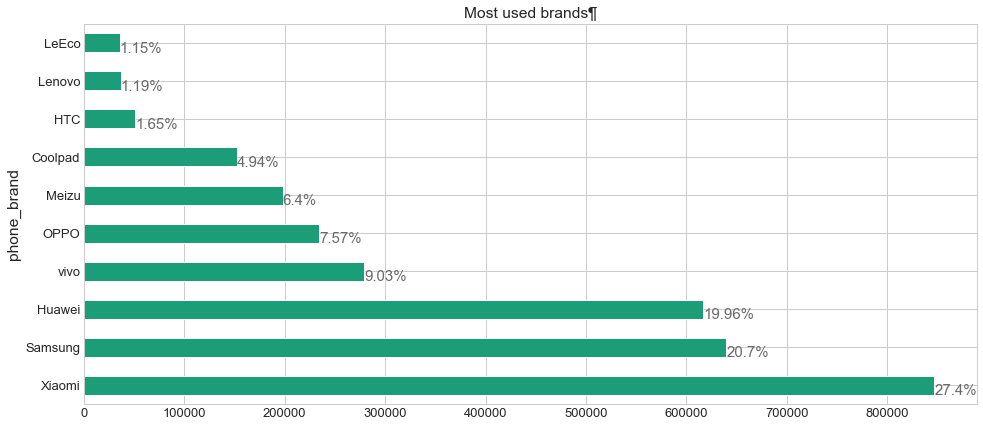

In [39]:

plt.title("Most used brands¶")
ax=(df_final.groupby('phone_brand')['event_id'].count()).nlargest(10).plot(kind='barh', figsize=(16,7), cmap='Dark2', fontsize=13)
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in ax.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+10, i.get_y(), \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,color='dimgrey')

### Top 10 owned models

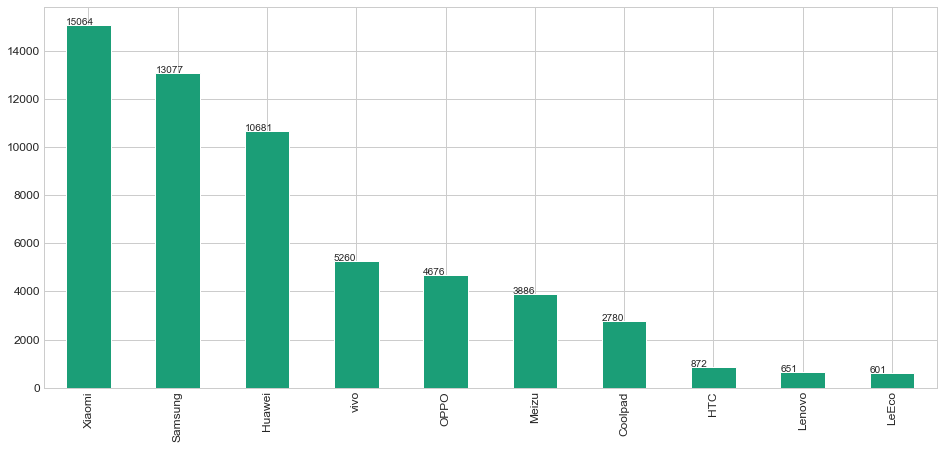

In [40]:


df_top_brand=df_final.groupby(['device_id','phone_brand'])['event_id'].count().to_frame().reset_index()
ax = df_top_brand.phone_brand.value_counts().head(10).plot.bar(figsize=(16,7),fontsize=12,cmap='Dark2')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()))


Text(0.5, 1.0, 'Phone Brand Distribution Across States')

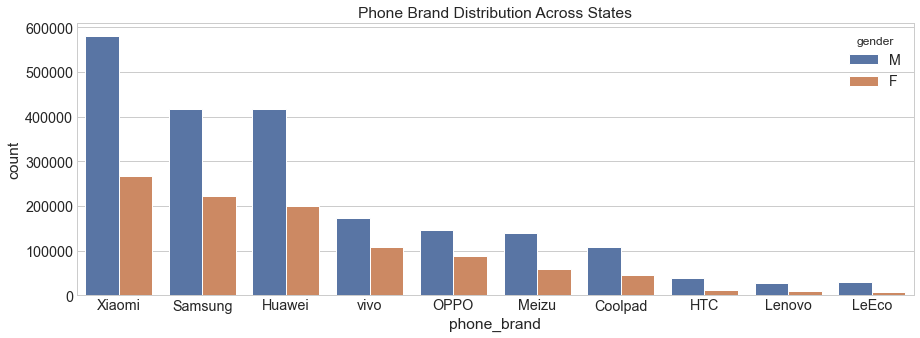

In [41]:
# phone distribution across gender

fig, axis1 = plt.subplots(1,1,figsize=(15,5))
sns.countplot(x='phone_brand', hue="gender",order=df_final.phone_brand.value_counts().iloc[:10].index, data=df_final, ax=axis1)
plt.title("Phone Brand Distribution Across States")

Text(0.5, 1.0, 'Phone Brand Distribution Across Age grouo')

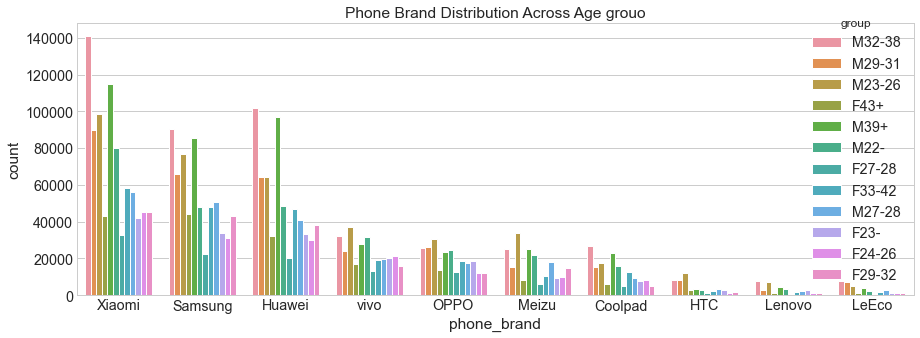

In [42]:
# phone distribution across gender

fig, axis1 = plt.subplots(1,1,figsize=(15,5))
sns.countplot(x='phone_brand', hue="group",order=df_final.phone_brand.value_counts().iloc[:10].index, data=df_final, ax=axis1)
plt.title("Phone Brand Distribution Across Age grouo")

In [43]:
from folium.plugins import MarkerCluster
map1 = folium.Map(location=[22.356359, 79.395484], zoom_start=5)
mc2 = MarkerCluster()
state_list = ['Maharashtra']

for state in state_list:
    mapping_data = df_final[['latitude', 'longitude','city']][df_final['state']==state].drop_duplicates()
    citylist = mapping_data['city'].tolist()
        
    locations = mapping_data[['latitude', 'longitude']]
    locationlist = locations.values.tolist()
    
    for index, item in enumerate(locationlist):
        mc2.add_child(folium.Marker(location=item, popup=citylist[index]))
                             
map1.add_child(mc2)
map1.save("state_wise_map_plot.html")
map1

<Figure size 1080x360 with 0 Axes>

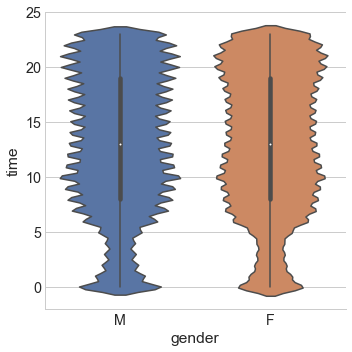

In [44]:
plt.figure(figsize=(15,5))
sns.catplot(x="gender", y='time', kind="violin", data=df_final)

<Figure size 1080x360 with 0 Axes>

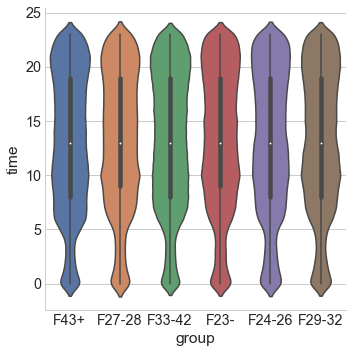

In [45]:
plt.figure(figsize=(15,5))
sns.catplot(x="group", y='time', kind="violin", data=df_final[df_final['gender']=='F'])

<Figure size 1080x360 with 0 Axes>

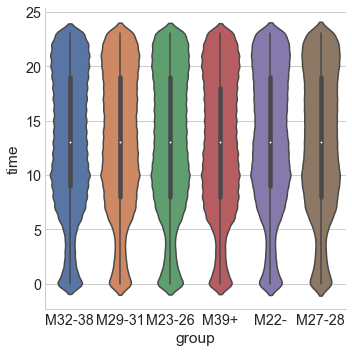

In [46]:
plt.figure(figsize=(15,5))
sns.catplot(x="group", y='time', kind="violin", data=df_final[df_final['gender']=='M'])

In [47]:
df_final.columns
#df_final.date.value_counts()

Index(['event_id', 'device_id', 'timestamp', 'longitude', 'latitude', 'city',
       'state', 'year', 'month', 'day', 'time', 'phone_brand', 'device_model',
       'gender', 'age', 'group'],
      dtype='object')

In [48]:
df_final.day.value_counts()

3     483293
5     478998
4     473487
6     471730
2     451547
7     448346
1     444588
30    959   
8     2     
Name: day, dtype: int64

In [49]:
#df_final['day'] = pd.to_datetime(df_final['timestamp']).dt.weekday